# Sentiment Analysis of IMDB Movie Reviews


Dataset taken from Kaggle site.Link to the dataset https://www.kaggle.com/lakshmi25npathi/imdb-dataset-of-50k-movie-reviews

​

## Importing the Libraries

In [1]:
# Importing Libraries we need for our analysis

import pandas as pd
import numpy as np
from numpy import array,asarray,zeros

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


In [2]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
from bs4 import BeautifulSoup


In [3]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import plot_confusion_matrix


In [4]:
from keras.utils.np_utils import to_categorical 
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras import Sequential
from keras.layers import Embedding,LSTM
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from keras.layers.embeddings import Embedding

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import set_random_seed

import requests
from io import StringIO

Using TensorFlow backend.
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py

In [5]:
from sklearn.preprocessing import LabelBinarizer
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
from bs4 import BeautifulSoup
import spacy
import re,string,unicodedata
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.stem import LancasterStemmer,WordNetLemmatizer
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from textblob import TextBlob
from textblob import Word
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

## Loading the Dataset

In [6]:
# Loading the data using pandas
movie = pd.read_csv('C:\\Users\\chira\\Project\\Sentiment Analysis\\IMDB dataset.csv')


## EXPLORATORY DATA ANALYSIS

In [7]:
movie.head(25)

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
5,"Probably my all-time favorite movie, a story o...",positive
6,I sure would like to see a resurrection of a u...,positive
7,"This show was an amazing, fresh & innovative i...",negative
8,Encouraged by the positive comments about this...,negative
9,If you like original gut wrenching laughter yo...,positive


In [8]:
movie.tail(25)

,review,sentiment
49975,90 minutes of Mindy...Mindy is a tease to boyf...,negative
49976,"I saw the movie in the theater at its release,...",positive
49977,"Dog Bite Dog isn't going to be for everyone, b...",positive
49978,Halloween is one of those movies that gets you...,positive
49979,"I saw this with high expectations. Come on, it...",negative
49980,A stunning film of high quality.<br /><br />Ap...,positive
49981,"And I repeat, please do not see this movie! Th...",negative
49982,"To be hones, I used to like this show and watc...",negative
49983,"I loved it, having been a fan of the original ...",positive
49984,Hello it is I Derrick Cannon and I welcome you...,negative


In [9]:
movie.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


Both columns contain string data types.
The dataset has no missing values.

In [10]:
movie.info

<bound method DataFrame.info of                                                   review sentiment
0      One of the other reviewers has mentioned that ...  positive
1      A wonderful little production. <br /><br />The...  positive
2      I thought this was a wonderful way to spend ti...  positive
3      Basically there's a family where a little boy ...  negative
4      Petter Mattei's "Love in the Time of Money" is...  positive
...                                                  ...       ...
49995  I thought this movie did a down right good job...  positive
49996  Bad plot, bad dialogue, bad acting, idiotic di...  negative
49997  I am a Catholic taught in parochial elementary...  negative
49998  I'm going to have to disagree with the previou...  negative
49999  No one expects the Star Trek movies to be high...  negative

[50000 rows x 2 columns]>

In [11]:
movie.describe()

,review,sentiment
count,50000,50000
unique,49582,2
top,Loved today's show!!! It was a variety and not...,positive
freq,5,25000


In [12]:
movie.shape

(50000, 2)

In [13]:
#sentiment count
movie['sentiment'].value_counts()

positive    25000
negative    25000
Name: sentiment, dtype: int64

We can see that the dataset is balanced because it contain equal number of positive and negative reviews.

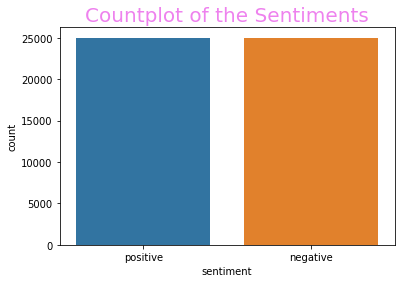

In [14]:
# plotting the labels using seaborn

sns.countplot(movie.sentiment)
plt.title('Countplot of the Sentiments', fontsize = 20, color = 'Violet')
plt.show()

## Data Preprocessing and Cleaning the Data

In [15]:
# Here we create a function to clean the text data
# we will use regular expressions here alot since our data dtype is string/text.

def cleaning(data):
  
  # removing tags
  phrase = remove_tags(data)
  
  # remove special characters i.e r
  # remove anything thats not a to z or A-Z
  
  phrase = re.sub('[^a-zA-Z]', ' ', phrase)
  
  # remove multiple spaces
  phrase = re.sub(r'\s+', ' ',phrase)
  
  return phrase
 

In [16]:
# This is to initialize the function to 
# remove the tags
# earlier created in the previus function.

TAG_RE = re.compile(r'<[^>]+>')


def remove_tags(text):
  return TAG_RE.sub('', text)

In [17]:
# we want pre process our dataset by applying the function we created

X = []
phrases = list(movie['review'])
for data in phrases:
  X.append(cleaning(data))

In [18]:
# checking the 35th review we get the result below
X[34]

'I watched this film not really expecting much I got it in a pack of films all of which were pretty terrible in their own way for under a fiver so what could I expect and you know what I was right they were all terrible this movie has a few and a few is stretching it interesting points the occasional camcorder view is a nice touch the drummer is very like a drummer i e damned annoying and well thats about it actually the problem is that its just so boring in what I can only assume was an attempt to build tension a whole lot of nothing happens and when it does its utterly tedious I had my thumb on the fast forward button ready to press for most of the movie but gave it a go and seriously is the lead singer of the band that great looking coz they don t half mention how beautiful he is a hell of a lot I thought he looked a bit like a meercat all this and I haven t even mentioned the killer I m not even gonna go into it its just not worth explaining Anyway as far as I m concerned Star and 

## Spliting the training Dataset

In [19]:
#split the dataset  
#train dataset
train_reviews=movie.review[:40000]
train_sentiments=movie.sentiment[:40000]

#test dataset
test_reviews=movie.review[40000:]
test_sentiments=movie.sentiment[40000:]
print(train_reviews.shape,train_sentiments.shape)
print(test_reviews.shape,test_sentiments.shape)

(40000,) (40000,)
(10000,) (10000,)


In [20]:
# Defining our y; the label
# Since it is a strings we map it to numericals

y = movie['sentiment']

y = np.array(list(map(lambda x: 1 if x=='positive' else 0,y)))

In [21]:
# Splitting our data into train and test sets
# we will use 80% training set and 20% test set

X_train, X_test,y_train,y_test = train_test_split(X,y, test_size=0.2, random_state=42)

### Text normalization

In [22]:
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize.toktok import ToktokTokenizer
#Tokenization of text
tokenizer=ToktokTokenizer()
#Setting English stopwords
stopword_list=nltk.corpus.stopwords.words('english')

In [23]:

#Removing html strips and noise text

from bs4 import BeautifulSoup
#Removing the html strips
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

#Removing the square brackets
def remove_between_square_brackets(text):
    return re.sub('\[[^]]*\]', '', text)

#Removing the noisy text
def denoise_text(text):
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    return text
#Apply function on review column
movie['review']=movie['review'].apply(denoise_text)

#function for removing special characters
def remove_special_characters(text, remove_digits=True):
    pattern=r'[^a-zA-z0-9\s]'
    text=re.sub(pattern,'',text)
    return text
#Apply function on review column
movie['review']=movie['review'].apply(remove_special_characters)



In [24]:
#Define function for removing special characters
def remove_special_characters(text, remove_digits=True):
    pattern=r'[^a-zA-z0-9\s]'
    text=re.sub(pattern,'',text)
    return text
#Apply function on review column
movie['review']=movie['review'].apply(remove_special_characters)


### Text stemming

Stemming is Text Normalization (or sometimes called Word Normalization) techniques in the field of Natural Language Processing that are used to prepare text, words, and documents for further processing.

In [25]:
#Stemming the text
def simple_stemmer(text):
    ps=nltk.porter.PorterStemmer()
    text= ' '.join([ps.stem(word) for word in text.split()])
    return text
#Apply function on review column
movie['review']=movie['review'].apply(simple_stemmer)


### Stopwords Removal

In [26]:
#set stopwords to english
stop=set(stopwords.words('english'))
print(stop)

#removing the stopwords
def remove_stopwords(text, is_lower_case=False):
    tokens = tokenizer.tokenize(text)
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stopword_list]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)    
    return filtered_text
#Apply function on review column
movie['review']=movie['review'].apply(remove_stopwords)

{'ma', 'have', 'wouldn', 'until', 'mustn', 'they', 'y', 'than', 'under', 'myself', "it's", 'were', 'just', 've', 'hers', 'did', 'when', 'few', 'aren', 'own', 'below', 'shan', 'having', 'very', 'then', 'll', "hasn't", 'who', 'should', 'same', 'are', "doesn't", 'weren', "aren't", 'my', 'yourself', 'against', 'will', 'why', 'hadn', 'after', 'because', 'an', 'we', "isn't", "won't", 'me', 'which', 'can', 'itself', 'you', 'once', 'on', 'before', 'both', 'this', "you'll", 'through', 'some', 'won', 'whom', "she's", 'a', 'is', 'more', 'the', 'mightn', 'down', 'such', 'themselves', 'while', 'what', 'in', 'any', 'so', 'don', 'ourselves', 'other', 'about', 'am', 'been', 'these', 'too', 'hasn', 'i', 'where', 'he', "wasn't", "should've", "needn't", 'no', 'out', 'those', 'our', 'him', 'now', 'that', "weren't", 'further', 'couldn', 'above', 'them', 'there', 'o', 'each', 'didn', 'if', 'only', 'his', 't', 'at', 'for', 'by', 'but', "that'll", "didn't", 'nor', 'yourselves', 'needn', 'how', "shan't", 'ours

#### Normalized train reviews

In [27]:
#normalized train reviews
norm_train_reviews=movie.review[:40000]
norm_train_reviews[100]

'thi short film inspir soontob full length featur spatula mad hilari piec contend similar cartoon yield multipl writer short film star edward spatula fire hi job join fight evil spoon thi premis allow funni content near begin bare present remaind featur thi film 15minut run time absorb oddbal comedi small music number unfortun much els lie plot set doesnt realli time show sure follow plot better mani highbudget hollywood film thi film worth watch least time take dont expect deep stori'

#### Normalized test reviews

In [28]:
#Normalized test reviews
norm_test_reviews=movie.review[40000:]
norm_test_reviews[45005]

'read review watch thi piec cinemat garbag took least 2 page find somebodi els didnt think thi appallingli unfunni montag wasnt acm humour 70 inde ani era thi isnt least funni set sketch comedi ive ever seen itll till come along half skit alreadi done infinit better act monti python woodi allen wa say nice piec anim last 90 second highlight thi film would still get close sum mindless drivelridden thi wast 75 minut semin comedi onli world semin realli doe mean semen scatolog humour onli world scat actual fece precursor joke onli mean thi handbook comedi tit bum odd beaver niceif pubesc boy least one hand free havent found playboy exist give break becaus wa earli 70 way sketch comedi go back least ten year prior onli way could even forgiv thi film even made wa gunpoint retro hardli sketch clown subtli pervert children may cut edg circl could actual funni come realli quit sad kept go throughout entir 75 minut sheer belief may save genuin funni skit end gave film 1 becaus wa lower scoreand

## Bags of words model

Used to convert text documents to numerical vectors or bag of words.

In [29]:
#Count vectorizer for bag of words
cv=CountVectorizer(min_df=0,max_df=1,binary=False,ngram_range=(1,3))
#transformed train reviews
cv_train_reviews=cv.fit_transform(norm_train_reviews)
#transformed test reviews
cv_test_reviews=cv.transform(norm_test_reviews)

print('BOW_cv_train:',cv_train_reviews.shape)
print('BOW_cv_test:',cv_test_reviews.shape)

BOW_cv_train: (40000, 6209089)
BOW_cv_test: (10000, 6209089)


## Term Frequency-Inverse Document Frequency model (TFIDF)

It is used to convert text documents to matrix of tfidf features.

In [30]:
#Tfidf vectorizer
tv=TfidfVectorizer(min_df=0,max_df=1,use_idf=True,ngram_range=(1,3))
#transformed train reviews
tv_train_reviews=tv.fit_transform(norm_train_reviews)
#transformed test reviews
tv_test_reviews=tv.transform(norm_test_reviews)
print('Tfidf_train:',tv_train_reviews.shape)
print('Tfidf_test:',tv_test_reviews.shape)

Tfidf_train: (40000, 6209089)
Tfidf_test: (10000, 6209089)


### Labeling the sentiment text

In [31]:
#labeling the sentient data
lb=LabelBinarizer()
#transformed sentiment data
sentiment_data=lb.fit_transform(movie['sentiment'])
print(sentiment_data.shape)

(50000, 1)


### Spliting the sentiment data

In [32]:
#Spliting the sentiment data
train_sentiments=sentiment_data[:40000]
test_sentiments=sentiment_data[40000:]
print(train_sentiments)
print(test_sentiments)

[[1]
 [1]
 [1]
 ...
 [1]
 [0]
 [0]]
[[0]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]]


In [33]:
train_reviews

0        one review ha mention watch 1 Oz episod youll ...
1        wonder littl product film techniqu veri unassu...
2        thought thi wa wonder way spend time hot summe...
3        basic famili littl boy jake think zombi hi clo...
4        petter mattei love time money visual stun film...
                               ...                        
39995    thi wa marvel funni comedi great cast john rit...
39996    plot central charact move camera closeup fact ...
39997    thi show awesom love actor ha great stori line...
39998    fact thi movi ha entitl success movi switzerla...
39999    confess sever disappointedthi version way comp...
Name: review, Length: 40000, dtype: object

In [34]:
test_reviews

40000    first want say lean liber polit scale found mo...
40001    wa excit see sitcom would hope repres indian c...
40002    look cover read stuff entir differ type movi c...
40003    like mani count appear denni hopper make thi c...
40004    thi movi wa tv day didnt enjoy first georg jun...
                               ...                        
49995    thought thi movi right good job wasnt creativ ...
49996    bad plot bad dialogu bad act idiot direct anno...
49997    cathol taught parochi elementari school nun ta...
49998    Im go disagre previou comment side maltin thi ...
49999    one expect star trek movi high art fan expect ...
Name: review, Length: 10000, dtype: object

## Machine Learning Models

### Logistic regression model for both bag of words and tfidf features

In [35]:
#training the model
lr=LogisticRegression(penalty='l2',max_iter=500,C=1,random_state=42)


In [36]:
#Fitting the model for Bag of words
lr_bow=lr.fit(cv_train_reviews,train_sentiments)
print(lr_bow)


LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=500,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [37]:
#Fitting the model for tfidf features
lr_tfidf=lr.fit(tv_train_reviews,train_sentiments)
print(lr_tfidf)

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=500,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


Logistic regression model performane on test dataset

In [38]:
#Predicting the model for bag of words
lr_bow_predict=lr.predict(cv_test_reviews)
print(lr_bow_predict)


[0 0 0 ... 0 1 1]


In [39]:
##Predicting the model for tfidf features
lr_tfidf_predict=lr.predict(tv_test_reviews)
print(lr_tfidf_predict)

[0 0 0 ... 0 1 1]


In [40]:
#Accuracy score for bag of words
lr_bow_score=accuracy_score(test_sentiments,lr_bow_predict)
print("lr_bow_score :",lr_bow_score)
#Accuracy score for tfidf features
lr_tfidf_score=accuracy_score(test_sentiments,lr_tfidf_predict)
print("lr_tfidf_score :",lr_tfidf_score)

lr_bow_score : 0.7512
lr_tfidf_score : 0.75


In [41]:
#Classification report for bag of words 
lr_bow_report=classification_report(test_sentiments,lr_bow_predict,target_names=['Positive','Negative'])
print(lr_bow_report)

#Classification report for tfidf features
lr_tfidf_report=classification_report(test_sentiments,lr_tfidf_predict,target_names=['Positive','Negative'])
print(lr_tfidf_report)

              precision    recall  f1-score   support

    Positive       0.75      0.75      0.75      4993
    Negative       0.75      0.75      0.75      5007

    accuracy                           0.75     10000
   macro avg       0.75      0.75      0.75     10000
weighted avg       0.75      0.75      0.75     10000

              precision    recall  f1-score   support

    Positive       0.74      0.77      0.75      4993
    Negative       0.76      0.73      0.75      5007

    accuracy                           0.75     10000
   macro avg       0.75      0.75      0.75     10000
weighted avg       0.75      0.75      0.75     10000



In [42]:
#confusion matrix for bag of words
cm_bow=confusion_matrix(test_sentiments,lr_bow_predict,labels=[1,0])
print(cm_bow)
#confusion matrix for tfidf features
cm_tfidf=confusion_matrix(test_sentiments,lr_tfidf_predict,labels=[1,0])
print(cm_tfidf)

[[3768 1239]
 [1249 3744]]
[[3663 1344]
 [1156 3837]]


### Stochastic gradient descent or Linear support vector machines for bag of words and tfidf features

In [43]:
#training the linear svm
svm=SGDClassifier(loss='hinge',random_state=42)
#fitting the svm for bag of words
svm_bow=svm.fit(cv_train_reviews,train_sentiments)
print(svm_bow)
#fitting the svm for tfidf features
svm_tfidf=svm.fit(tv_train_reviews,train_sentiments)
print(svm_tfidf)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)


Model Performance on test data

In [44]:
#Predicting the model for bag of words
svm_bow_predict=svm.predict(cv_test_reviews)
print(svm_bow_predict)
#Predicting the model for tfidf features
svm_tfidf_predict=svm.predict(tv_test_reviews)
print(svm_tfidf_predict)

[1 1 0 ... 1 1 1]
[1 1 1 ... 1 1 1]


In [45]:
#Accuracy score for bag of words
svm_bow_score=accuracy_score(test_sentiments,svm_bow_predict)
print("svm_bow_score :",svm_bow_score)
#Accuracy score for tfidf features
svm_tfidf_score=accuracy_score(test_sentiments,svm_tfidf_predict)
print("svm_tfidf_score :",svm_tfidf_score)

svm_bow_score : 0.5829
svm_tfidf_score : 0.5112


In [46]:
#Classification report for bag of words 
svm_bow_report=classification_report(test_sentiments,svm_bow_predict,target_names=['Positive','Negative'])
print(svm_bow_report)
#Classification report for tfidf features
svm_tfidf_report=classification_report(test_sentiments,svm_tfidf_predict,target_names=['Positive','Negative'])
print(svm_tfidf_report)

              precision    recall  f1-score   support

    Positive       0.94      0.18      0.30      4993
    Negative       0.55      0.99      0.70      5007

    accuracy                           0.58     10000
   macro avg       0.74      0.58      0.50     10000
weighted avg       0.74      0.58      0.50     10000

              precision    recall  f1-score   support

    Positive       1.00      0.02      0.04      4993
    Negative       0.51      1.00      0.67      5007

    accuracy                           0.51     10000
   macro avg       0.75      0.51      0.36     10000
weighted avg       0.75      0.51      0.36     10000



In [47]:
#confusion matrix for bag of words
cm_bow=confusion_matrix(test_sentiments,svm_bow_predict,labels=[1,0])
print(cm_bow)
#confusion matrix for tfidf features
cm_tfidf=confusion_matrix(test_sentiments,svm_tfidf_predict,labels=[1,0])
print(cm_tfidf)

[[4948   59]
 [4112  881]]
[[5007    0]
 [4888  105]]


### Multinomial Naive Bayes for bag of words and tfidf features

In [48]:
#training the model
mnb=MultinomialNB()
#fitting the svm for bag of words
mnb_bow=mnb.fit(cv_train_reviews,train_sentiments)
print(mnb_bow)


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)


In [49]:
#fitting the svm for tfidf features
mnb_tfidf=mnb.fit(tv_train_reviews,train_sentiments)
print(mnb_tfidf)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)


In [50]:
#Predicting the model for bag of words
mnb_bow_predict=mnb.predict(cv_test_reviews)
print(mnb_bow_predict)
#Predicting the model for tfidf features
mnb_tfidf_predict=mnb.predict(tv_test_reviews)
print(mnb_tfidf_predict)

[0 0 0 ... 0 1 1]
[0 0 0 ... 0 1 1]


In [51]:
#Accuracy score for bag of words
mnb_bow_score=accuracy_score(test_sentiments,mnb_bow_predict)
print("mnb_bow_score :",mnb_bow_score)
#Accuracy score for tfidf features
mnb_tfidf_score=accuracy_score(test_sentiments,mnb_tfidf_predict)
print("mnb_tfidf_score :",mnb_tfidf_score)

mnb_bow_score : 0.751
mnb_tfidf_score : 0.7509


In [52]:
#Classification report for bag of words 
mnb_bow_report=classification_report(test_sentiments,mnb_bow_predict,target_names=['Positive','Negative'])
print(mnb_bow_report)
#Classification report for tfidf features
mnb_tfidf_report=classification_report(test_sentiments,mnb_tfidf_predict,target_names=['Positive','Negative'])
print(mnb_tfidf_report)

              precision    recall  f1-score   support

    Positive       0.75      0.76      0.75      4993
    Negative       0.75      0.75      0.75      5007

    accuracy                           0.75     10000
   macro avg       0.75      0.75      0.75     10000
weighted avg       0.75      0.75      0.75     10000

              precision    recall  f1-score   support

    Positive       0.75      0.76      0.75      4993
    Negative       0.75      0.74      0.75      5007

    accuracy                           0.75     10000
   macro avg       0.75      0.75      0.75     10000
weighted avg       0.75      0.75      0.75     10000



In [53]:
#confusion matrix for bag of words
cm_bow=confusion_matrix(test_sentiments,mnb_bow_predict,labels=[1,0])
print(cm_bow)
#confusion matrix for tfidf features
cm_tfidf=confusion_matrix(test_sentiments,mnb_tfidf_predict,labels=[1,0])
print(cm_tfidf)


[[3736 1271]
 [1219 3774]]
[[3729 1278]
 [1213 3780]]


We can observed that both logistic regression and multinomial naive bayes model performing well compared to linear support vector machines.Linear support vector is worst for sentiment analysis of reviews.

 Creation the embedding layer.
 The embedding layer converts our textual data into numerical data.
 It is used as the first layer for the deep learning models in keras.

In [54]:
# The tokenizer module creates a word to index dictionary.
# Each word is used as key while the corresponding unique index,
# is used as the value for the key.

tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)
 
X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)

In [55]:
X_train

[[11,
  12,
  47,
  9,
  790,
  2137,
  527,
  302,
  1,
  108,
  1876,
  2005,
  4293,
  2,
  786,
  4796,
  11,
  1,
  227,
  1,
  81,
  768,
  55,
  53,
  20,
  101,
  4,
  1,
  28,
  1984,
  102,
  35,
  27,
  36,
  120,
  1108,
  11,
  7,
  6,
  2338,
  1171,
  5,
  451,
  47,
  543,
  5,
  92,
  32,
  24,
  41,
  896,
  400,
  16,
  1,
  156,
  5,
  2948,
  26,
  4330,
  21,
  3,
  2910,
  11,
  46,
  75,
  221,
  73,
  127,
  8,
  80,
  3112,
  195,
  21,
  235,
  2,
  1,
  430,
  9,
  200,
  4898,
  9,
  138,
  23,
  64,
  28,
  16,
  74,
  361,
  302,
  3,
  19,
  18,
  7,
  200,
  29,
  305,
  11,
  14,
  1,
  1834,
  12,
  116,
  416,
  2,
  14,
  1,
  1666,
  565,
  71,
  422,
  376,
  9,
  86,
  22,
  118,
  47,
  114,
  364,
  32,
  37,
  18,
  45,
  9,
  13,
  92,
  9,
  201,
  16,
  3,
  360,
  1152,
  63,
  8,
  1,
  462,
  217,
  997,
  5,
  4136,
  8,
  3,
  176,
  4,
  36,
  436,
  684,
  610,
  11,
  70,
  230,
  236,
  111,
  834,
  37,
  171,
  31,
  220,
  11,
 

In [56]:
print(y_train)
print(y_test)

[0 0 1 ... 0 1 1]
[1 1 0 ... 1 0 1]


In [57]:
X_test

[[9,
  64,
  421,
  10,
  680,
  5,
  1,
  165,
  4,
  1,
  1,
  2,
  41,
  1,
  165,
  443,
  13,
  222,
  5,
  68,
  16,
  48,
  287,
  3449,
  10,
  95,
  27,
  75,
  28,
  4,
  1,
  116,
  12,
  122,
  45,
  1,
  154,
  22,
  27,
  8,
  1,
  277,
  1575,
  452,
  147,
  16,
  7,
  12,
  57,
  7,
  13,
  556,
  5,
  27,
  3,
  626,
  1710,
  124,
  1508,
  3,
  555,
  124,
  18,
  9,
  138,
  1262,
  210,
  27,
  1153,
  7,
  13,
  3,
  376,
  277,
  1575,
  41,
  38,
  173,
  1011,
  6,
  8,
  6,
  376,
  80,
  4293,
  21,
  1,
  3376,
  71,
  1508,
  2497,
  1071,
  1508,
  2188,
  1508,
  10,
  13,
  1,
  1575,
  115,
  767,
  26,
  191,
  765,
  4,
  3,
  638,
  2843,
  1508,
  502,
  4095,
  87,
  304,
  21,
  91,
  304,
  21,
  1648,
  2,
  523,
  17,
  1,
  2,
  13,
  212,
  52,
  222,
  91,
  2646,
  4623,
  546,
  21,
  1269,
  8,
  159,
  376,
  1011,
  1,
  3180,
  2,
  546,
  21,
  2,
  1,
  2,
  1,
  175,
  415,
  452,
  10,
  1011,
  13,
  343,
  2,
  7,
  46,
  3,
  3

Ecah file contain integers.Each list correspond to each sentence in the training set.

In [58]:
# Assessing the length of sentences in the reviews

lengths = [len(i) for i in X_train+X_test]

print(f'Max length of sentence: {max(lengths)}')
print(f'Average length of sentence: {np.mean(lengths)}')


Max length of sentence: 2117
Average length of sentence: 212.34318


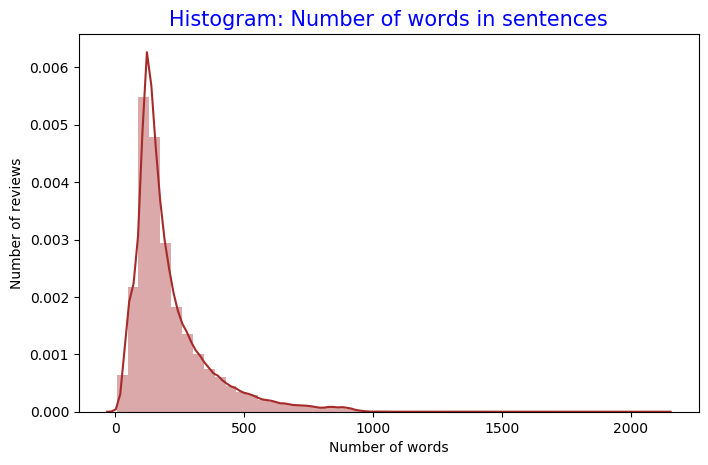

In [59]:
# Using seaborn to plot the sentence length
# specifying the figure size
# Labeling the title, x axis and y axis
# Displaying the chart

plt.figure(figsize = (8,5), dpi = 100)
sns.distplot(lengths, color = 'brown')
plt.title('Histogram: Number of words in sentences', fontsize = 15, color = 'Blue')
plt.ylabel('Number of reviews')
plt.xlabel('Number of words')
plt.show()

In [60]:
# We will set a maximum size of each list to 100
# The lists with > 100 will truncated.
# Lists with < 100 will be added 0 till the maximum length.
# This process is called padding

# The code below will find the vocabulary size and then perfom Padding 
# on both X_train and X_test

# tokenizer.word_index

vocab_size  = len(tokenizer.word_index)+ 1

maxlength = 100

X_train = pad_sequences(X_train, padding="post", maxlen=maxlength)
X_test = pad_sequences(X_test, padding="post", maxlen=maxlength)

In [61]:
# Checking that a random list in X_train (previously sentences)
# have the same length of 100

len(X_train[2])

100

In [62]:
X_train

array([[ 617,    1,  266, ...,  200,  348, 3825],
       [  85,   20,   50, ...,   22,  103,    7],
       [   3, 1319,  112, ...,    0,    0,    0],
       ...,
       [ 782,   10,   28, ...,    0,    0,    0],
       [  10,  350,   13, ...,    0,    0,    0],
       [ 295,    8,   10, ...,   71,   73, 1963]])

In [63]:
vocab_size
#it indicate that we have 92547 unique words in the corpus.Neural network are designed to learn from numerical data.
#Word Embedding is really all about improving the ability of network to learn from text data.These vectors are Embeddings.

92547

In [64]:
# Creating a feature matrix
# Here we wil use GloVe Embeddings
# GloVe stands for Global Vectors for word representation.
# It is an unsupervised learning algorithm developed by Stanford for,
# Generating word embeddings by aggregating global word-word co-occurrence matrix from a corpus
# The resulting embeddings show interesting linear substructures of the word in vector space.
# In other words, if two words co-occur many times,
# it means they have some linguistic or semantic similarity.

# Here GloVe word Embedding will create a dictionary,
# that will contain words as keys and and their corresponding embedding list as values
# 

embedding_dictionary = dict()

glove_file = open('C:\\Users\\chira\\Projects\\IMDB sentiment analysis\\glove.6B.100d.txt', encoding="utf8")


for line in glove_file:
  record = line.split()
  word = record[0]
  dimensions = asarray(record [1:], dtype="float32")
  embedding_dictionary [word] = dimensions
glove_file.close()


In [65]:
# Creating an Embedding matrix
# here, each row number will correspond to the index of the word in the corpus.
# The matrix will contain the GloVe word embeddings for the words in our corpus.
# 

embedding_matrix  = zeros((vocab_size, 100))

for word, index in tokenizer.word_index.items():
  
  embedding_vector = embedding_dictionary.get(word)
  
  if embedding_vector  is not None:
    
    embedding_matrix[index] = embedding_vector

In [66]:
# Viewing the embedding vector

embedding_vector

array([ 0.99882  ,  0.044    ,  0.58508  ,  0.96     ,  0.098084 ,
       -0.0022934, -0.1695   ,  1.1139   , -0.15384  ,  0.802    ,
        1.347    ,  0.35911  , -0.63915  , -1.2736   , -0.69913  ,
       -0.2875   ,  0.38705  , -0.11684  ,  0.31795  , -1.5145   ,
        0.5244   , -0.77148  ,  0.2228   , -0.22528  ,  0.37621  ,
       -0.19916  ,  0.40378  , -0.87357  , -0.29921  , -0.26723  ,
        0.42806  , -0.59294  ,  0.422    ,  0.22028  , -0.0070494,
        0.63873  ,  0.7914   ,  0.40717  ,  0.23863  , -0.24061  ,
        0.31657  ,  0.021292 , -0.3244   , -0.70151  ,  0.33481  ,
        0.24906  , -0.37085  , -0.27512  ,  0.080021 ,  0.71951  ,
       -0.36113  ,  0.035023 ,  0.24478  , -1.0278   , -0.23183  ,
       -0.42703  , -0.26383  ,  0.44428  ,  0.5014   ,  0.061515 ,
       -0.42084  ,  0.43479  ,  0.51835  , -0.20161  , -0.47988  ,
       -0.22617  ,  1.1975   , -0.27753  ,  1.2086   ,  1.0786   ,
       -0.41692  ,  0.81516  , -1.3145   , -0.48762  , -0.4449

In [67]:
# Viewing the embedding matrix

embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.038194  , -0.24487001,  0.72812003, ..., -0.1459    ,
         0.82779998,  0.27061999],
       [-0.071953  ,  0.23127   ,  0.023731  , ..., -0.71894997,
         0.86894   ,  0.19539   ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.37771001,  0.22946   , -0.30311   , ..., -0.33610001,
         0.02637   , -0.72302002],
       [ 0.99882001,  0.044     ,  0.58508003, ..., -0.54869002,
         0.15141   ,  1.36880004]])

In [68]:
# Viewing the mebbeding dictionary

embedding_dictionary

{'the': array([-0.038194, -0.24487 ,  0.72812 , -0.39961 ,  0.083172,  0.043953,
        -0.39141 ,  0.3344  , -0.57545 ,  0.087459,  0.28787 , -0.06731 ,
         0.30906 , -0.26384 , -0.13231 , -0.20757 ,  0.33395 , -0.33848 ,
        -0.31743 , -0.48336 ,  0.1464  , -0.37304 ,  0.34577 ,  0.052041,
         0.44946 , -0.46971 ,  0.02628 , -0.54155 , -0.15518 , -0.14107 ,
        -0.039722,  0.28277 ,  0.14393 ,  0.23464 , -0.31021 ,  0.086173,
         0.20397 ,  0.52624 ,  0.17164 , -0.082378, -0.71787 , -0.41531 ,
         0.20335 , -0.12763 ,  0.41367 ,  0.55187 ,  0.57908 , -0.33477 ,
        -0.36559 , -0.54857 , -0.062892,  0.26584 ,  0.30205 ,  0.99775 ,
        -0.80481 , -3.0243  ,  0.01254 , -0.36942 ,  2.2167  ,  0.72201 ,
        -0.24978 ,  0.92136 ,  0.034514,  0.46745 ,  1.1079  , -0.19358 ,
        -0.074575,  0.23353 , -0.052062, -0.22044 ,  0.057162, -0.15806 ,
        -0.30798 , -0.41625 ,  0.37972 ,  0.15006 , -0.53212 , -0.2055  ,
        -1.2526  ,  0.071624,  

# Deep Learning Models

### Simple Deep Neural Network

In [69]:
# Creating a simple deep neural network
# create an embedding layer by specifying the parameters we created earlier
# Add it to the model
# flatten the embedding layer since we are directly connecting it to densely connected layer
# At the end we add a dense layer with sigmoid activation function.

model = Sequential()

embedding_layer = Embedding(vocab_size, 100, weights = [embedding_matrix],
                            input_length = maxlength, trainable = False)

model.add(embedding_layer)

model.add(Flatten())

model.add(Dense(1, activation = 'sigmoid'))


In [70]:
# Compiling our model
# Compile defines the loss function, the optimizer and the metrics.

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['acc'])

# printing the summary of information about our model
print(model.summary())


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 100, 100)          9254700   
_________________________________________________________________
flatten_1 (Flatten)          (None, 10000)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 10001     
Total params: 9,264,701
Trainable params: 10,001
Non-trainable params: 9,254,700
_________________________________________________________________
None


In [72]:
# Training the model
# We fit the model with the train set to train our neural network.
# The validation split indicates that 20% of the training data,
# will be used to find the training accuracy of the algorithm.

history = model.fit(X_train, y_train, batch_size = 128, 
                   epochs = 20, verbose = 1,
                  validation_split = 0.2 )


Train on 32000 samples, validate on 8000 samples
Epoch 1/20
32000/32000 [==============================] - 13s 402us/step - loss: 0.6036 - acc: 0.6679 - val_loss: 0.5417 - val_acc: 0.7244
Epoch 2/20
32000/32000 [==============================] - 2s 67us/step - loss: 0.5050 - acc: 0.7551 - val_loss: 0.5324 - val_acc: 0.7349
Epoch 3/20
32000/32000 [==============================] - 2s 60us/step - loss: 0.4636 - acc: 0.7818 - val_loss: 0.5256 - val_acc: 0.7459
Epoch 4/20
32000/32000 [==============================] - 2s 66us/step - loss: 0.4443 - acc: 0.7952 - val_loss: 0.5316 - val_acc: 0.7412
Epoch 5/20
32000/32000 [==============================] - 2s 64us/step - loss: 0.4279 - acc: 0.8019 - val_loss: 0.5521 - val_acc: 0.7319
Epoch 6/20
32000/32000 [==============================] - 2s 58us/step - loss: 0.4138 - acc: 0.8128 - val_loss: 0.5407 - val_acc: 0.7429
Epoch 7/20
32000/32000 [==============================] - 2s 64us/step - loss: 0.4069 - acc: 0.8149 - val_loss: 0.5520 - val_a

In [73]:
# To evaluate the performance of our model,
# we pass the test sets to the evaluate method of our model

score = model.evaluate(X_test, y_test, verbose = 1)

10000/10000 [==============================] - 4s 353us/step


In [74]:
# checking the accuracy

print(f'Test Accuarcy: {score[1]}')

Test Accuarcy: 0.7235000133514404


In [75]:
# Making predictions

y_pred = model.predict_classes(X_test)

y_pred

# printing the classifica

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.74      0.68      0.71      4961
           1       0.71      0.77      0.74      5039

    accuracy                           0.72     10000
   macro avg       0.73      0.72      0.72     10000
weighted avg       0.72      0.72      0.72     10000



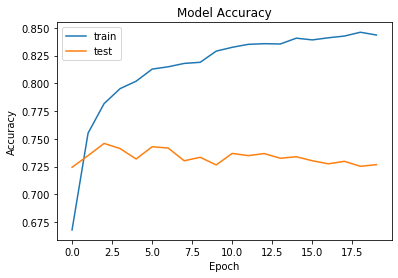

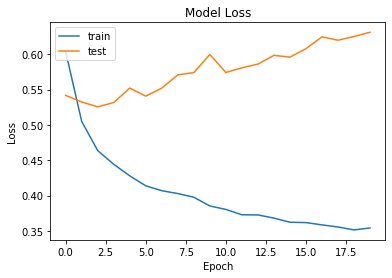

In [77]:
# Plotting the loss and accuracy differences for training and test sets
# Using matplotlib plotting library
# Giving a title to our chart
# Labeling the x and y axis
# creating a legend
# displaying the chart

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc = 'upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc = 'upper left')
plt.show()


The accuracy on training set is higher compare to test dataset so deep neural network is not good to mae predictions.

### Recurrent Neural Network + LSTM

Recurrent Neural network works well on sequence data. Text data is a sequence of word so RNN is good choice to solve text related problems.

In [78]:
# Building the model architecture
# Create an embedding layer by specifying the parameters we created earlier
# Creating a Recurrent neural network 
# Here we will use LTSM (Long Term Short Term Memory)
# Bidirectional means the RNN processes sequence from start to end,and also backwards
# This makes the model perform better.
# We added another hidden layer and included an activation function as relu.s
# At the end we add a dense layer with sigmoid activation function.
# 

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, 100, 
                              weights=[embedding_matrix], 
                              input_length=maxlength, trainable=False),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [79]:
# Compiling the model
# Here we specify the loss, optimizer and metrics appropriately.

model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=['accuracy'])

In [80]:
# printing the model summary to view paramaters
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 100, 100)          9254700   
_________________________________________________________________
bidirectional (Bidirectional (None, 256)               234496    
_________________________________________________________________
dense (Dense)                (None, 128)               32896     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 129       
Total params: 9,522,221
Trainable params: 267,521
Non-trainable params: 9,254,700
_________________________________________________________________


In [81]:
# Training the model
# We fit the model with the train set to train our neural network.
# The validation split indicates that 20% of the training data,
# will be used to find the training accuracy of the algorithm.

history = model.fit(X_train, y_train, epochs=10,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/10
32000/32000 [==============================] - 288s 9ms/sample - loss: 0.6157 - acc: 0.6552 - val_loss: 0.5231 - val_acc: 0.7449
Epoch 2/10
32000/32000 [==============================] - 295s 9ms/sample - loss: 0.5116 - acc: 0.7522 - val_loss: 0.4931 - val_acc: 0.7601
Epoch 3/10
32000/32000 [==============================] - 307s 10ms/sample - loss: 0.4816 - acc: 0.7702 - val_loss: 0.4637 - val_acc: 0.7779
Epoch 4/10
32000/32000 [==============================] - 309s 10ms/sample - loss: 0.4611 - acc: 0.7782 - val_loss: 0.4561 - val_acc: 0.7828
Epoch 5/10
32000/32000 [==============================] - 307s 10ms/sample - loss: 0.4537 - acc: 0.7855 - val_loss: 0.4873 - val_acc: 0.7592
Epoch 6/10
32000/32000 [==============================] - 307s 10ms/sample - loss: 0.4399 - acc: 0.7922 - val_loss: 0.4348 - val_acc: 0.7974
Epoch 7/10
32000/32000 [==============================] - 307s 10ms/sample - loss: 0.4351 - acc: 0.7972 - v

In [82]:
# Evaluating how the model performs while using the test set
# verbose shows how the model actions as it runs.

score = model.evaluate(X_test, y_test, verbose = 1)

10000/10000 [==============================] - 24s 2ms/sample - loss: 0.4158 - acc: 0.8066


In [83]:
# printint the accuracy score obtained from the test sets

print(f'Test Accuracy: {score[1]}')


Test Accuracy: 0.8065999746322632


In [ ]:
Training and test dataset accuracy are close to each other, so RNN(LSTM) model perform well on new data.

In [84]:
# Making predictions

y_pred = model.predict_classes(X_test)

y_pred

# printing the classification report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.84      0.81      4961
           1       0.83      0.78      0.80      5039

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



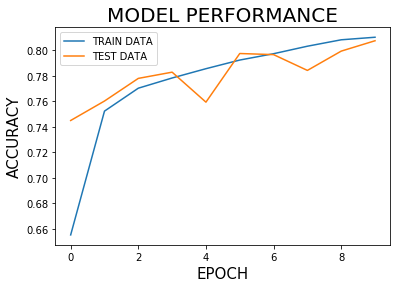

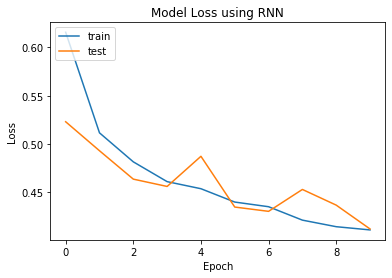

In [88]:
# Plotting the loss and accuracy differences for training and test sets
# Using matplotlib plotting library
# Giving a title to our chart
# Labeling the x and y axis
# creating a legend
# displaying the chart


plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

plt.title('MODEL PERFORMANCE', fontsize = 20)
plt.ylabel('ACCURACY', fontsize = 15)
plt.xlabel('EPOCH', fontsize = 15)
plt.legend(['TRAIN DATA', 'TEST DATA'], loc = 'upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss using RNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc = 'upper left')
plt.show()

### Recurrent Neural Network (2 RNN layer or 2 LSTM layer) + dropout

In [89]:
# Building the model 
# Create an embedding layer by specifying the parameters we created earlier
# Creating two Recurrent neural network layers
# Here we will use two LTSM (Long Term Short Term Memory) layers
# Bidirectional means the RNN processes sequence from start to end,and also backwards
# This makes the model perform better.
# We added another hidden layer and included an activation function as relu.
# Here we added Dropout to prevent the model from over fitting
# Dropout randomly removes some neurons in the hidden layers
# At the end we add a dense layer with sigmoid activation function.

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, 100,
                              weights=[embedding_matrix], 
                              input_length=maxlength, trainable=False),
    
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(50, return_sequences = True)),
    
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(25)),
    
    tf.keras.layers.Dense(50, activation='relu'),
    
    tf.keras.layers.Dropout(0.5),
        
    tf.keras.layers.Dense(1, activation='sigmoid')])

In [90]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 100, 100)          9254700   
_________________________________________________________________
bidirectional_1 (Bidirection (None, 100, 100)          60400     
_________________________________________________________________
bidirectional_2 (Bidirection (None, 50)                25200     
_________________________________________________________________
dense_2 (Dense)              (None, 50)                2550      
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 51        
Total params: 9,342,901
Trainable params: 88,201
Non-trainable params: 9,254,700
_______________________________________

In [91]:
# Compiling the model
# Specifying the loss, optimizer and metrics

model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=['accuracy'])

In [92]:
# Fitting the model with train sets for training
# Using 30 epochs here to find the optimal accuracy

history = model.fit(X_train, y_train, epochs= 10,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/10
32000/32000 [==============================] - 167s 5ms/sample - loss: 0.6660 - acc: 0.5959 - val_loss: 0.5921 - val_acc: 0.7088
Epoch 2/10
32000/32000 [==============================] - 157s 5ms/sample - loss: 0.5801 - acc: 0.7118 - val_loss: 0.5377 - val_acc: 0.7429
Epoch 3/10
32000/32000 [==============================] - 155s 5ms/sample - loss: 0.5354 - acc: 0.7419 - val_loss: 0.5020 - val_acc: 0.7606
Epoch 4/10
32000/32000 [==============================] - 157s 5ms/sample - loss: 0.5130 - acc: 0.7573 - val_loss: 0.4906 - val_acc: 0.7648
Epoch 5/10
32000/32000 [==============================] - 158s 5ms/sample - loss: 0.4963 - acc: 0.7678 - val_loss: 0.4732 - val_acc: 0.7793
Epoch 6/10
32000/32000 [==============================] - 159s 5ms/sample - loss: 0.4854 - acc: 0.7740 - val_loss: 0.4731 - val_acc: 0.7785
Epoch 7/10
32000/32000 [==============================] - 158s 5ms/sample - loss: 0.4746 - acc: 0.7821 - val_lo

In [93]:
# Fitting the model with train sets for training
# Using 30 epochs here to find the optimal accuracy

history = model.fit(X_train, y_train, epochs= 4,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/4
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4417 - acc: 0.7994 - val_loss: 0.4316 - val_acc: 0.8005
Epoch 2/4
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4354 - acc: 0.8034 - val_loss: 0.4202 - val_acc: 0.8061
Epoch 3/4
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4316 - acc: 0.8048 - val_loss: 0.4152 - val_acc: 0.8081
Epoch 4/4
32000/32000 [==============================] - 155s 5ms/sample - loss: 0.4248 - acc: 0.8077 - val_loss: 0.4177 - val_acc: 0.8073


In [94]:
history = model.fit(X_train, y_train, epochs= 5,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/5
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4179 - acc: 0.8122 - val_loss: 0.4109 - val_acc: 0.8131
Epoch 2/5
32000/32000 [==============================] - 157s 5ms/sample - loss: 0.4141 - acc: 0.8143 - val_loss: 0.4094 - val_acc: 0.8108
Epoch 3/5
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4096 - acc: 0.8156 - val_loss: 0.3986 - val_acc: 0.8173
Epoch 4/5
32000/32000 [==============================] - 156s 5ms/sample - loss: 0.4040 - acc: 0.8182 - val_loss: 0.4046 - val_acc: 0.8134
Epoch 5/5
32000/32000 [==============================] - 160s 5ms/sample - loss: 0.4030 - acc: 0.8193 - val_loss: 0.3948 - val_acc: 0.8186


In [95]:
history = model.fit(X_train, y_train, epochs= 2,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/2
32000/32000 [==============================] - 161s 5ms/sample - loss: 0.3974 - acc: 0.8215 - val_loss: 0.3927 - val_acc: 0.8199
Epoch 2/2
32000/32000 [==============================] - 181s 6ms/sample - loss: 0.3914 - acc: 0.8269 - val_loss: 0.3942 - val_acc: 0.8207


In [96]:
history = model.fit(X_train, y_train, epochs= 2,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/2
32000/32000 [==============================] - 194s 6ms/sample - loss: 0.3867 - acc: 0.8279 - val_loss: 0.4316 - val_acc: 0.7959
Epoch 2/2
32000/32000 [==============================] - 194s 6ms/sample - loss: 0.3845 - acc: 0.8303 - val_loss: 0.4199 - val_acc: 0.8121


In [97]:
history = model.fit(X_train, y_train, epochs= 1,
                    batch_size = 128, verbose = 1,
                   validation_split = 0.2)

Train on 32000 samples, validate on 8000 samples
32000/32000 [==============================] - 190s 6ms/sample - loss: 0.3817 - acc: 0.8295 - val_loss: 0.3995 - val_acc: 0.8217


In [98]:
# Evaluating the model using the test set

score = model.evaluate(X_test, y_test, verbose = 1)

10000/10000 [==============================] - 25s 2ms/sample - loss: 0.4032 - acc: 0.8193


In [99]:
# Making predictions

y_pred = model.predict_classes(X_test)

y_pred

# printing the classification

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.75      0.80      4961
           1       0.78      0.89      0.83      5039

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



Accuracy using additional RNN layer(2 RNN layer + LSTM) is 82%.

In [102]:
from keras.layers.core import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D,Conv1D,LSTM

### Convolutional Neural Network with dropout

In [103]:
model = Sequential()

embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlength , trainable=False)
model.add(embedding_layer)

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dropout(0.2)),
model.add(Dense(1, activation='sigmoid'))


In [104]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [105]:
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 100, 100)          9254700   
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 96, 128)           64128     
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 128)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 9,318,957
Trainable params: 64,257
Non-trainable params: 9,254,700
_________________________________________________________________
None


In [106]:
history = model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)

score = model.evaluate(X_test, y_test, verbose=1)

Train on 32000 samples, validate on 8000 samples
Epoch 1/6
32000/32000 [==============================] - 25s 781us/step - loss: 0.5441 - acc: 0.7176 - val_loss: 0.4347 - val_acc: 0.7985
Epoch 2/6
32000/32000 [==============================] - 24s 736us/step - loss: 0.4056 - acc: 0.8145 - val_loss: 0.3889 - val_acc: 0.8200
Epoch 3/6
32000/32000 [==============================] - 26s 798us/step - loss: 0.3569 - acc: 0.8426 - val_loss: 0.3692 - val_acc: 0.8326
Epoch 4/6
32000/32000 [==============================] - 24s 751us/step - loss: 0.3261 - acc: 0.8607 - val_loss: 0.3611 - val_acc: 0.8403
Epoch 5/6
32000/32000 [==============================] - 24s 749us/step - loss: 0.2945 - acc: 0.8766 - val_loss: 0.3723 - val_acc: 0.8307
Epoch 6/6
10000/10000 [==============================] - 3s 276us/step


In [107]:
history = model.fit(X_train, y_train, batch_size=128, epochs=4, verbose=1, validation_split=0.2)

score = model.evaluate(X_test, y_test, verbose=1)

Train on 32000 samples, validate on 8000 samples
Epoch 1/4
32000/32000 [==============================] - 27s 838us/step - loss: 0.2436 - acc: 0.9023 - val_loss: 0.3681 - val_acc: 0.8381
Epoch 2/4
32000/32000 [==============================] - 25s 795us/step - loss: 0.2260 - acc: 0.9093 - val_loss: 0.3790 - val_acc: 0.8334
Epoch 3/4
32000/32000 [==============================] - 27s 832us/step - loss: 0.2007 - acc: 0.9230 - val_loss: 0.3689 - val_acc: 0.8406
Epoch 4/4
10000/10000 [==============================] - 3s 290us/step


In [109]:
history = model.fit(X_train, y_train, batch_size=128, epochs=10, verbose=1, validation_split=0.2)

Train on 32000 samples, validate on 8000 samples
Epoch 1/10
32000/32000 [==============================] - 29s 913us/step - loss: 0.1668 - acc: 0.9378 - val_loss: 0.3773 - val_acc: 0.8432
Epoch 2/10
32000/32000 [==============================] - 32s 1ms/step - loss: 0.1533 - acc: 0.9432 - val_loss: 0.3911 - val_acc: 0.8436
Epoch 3/10
32000/32000 [==============================] - 32s 1ms/step - loss: 0.1371 - acc: 0.9517 - val_loss: 0.3963 - val_acc: 0.8396
Epoch 4/10
32000/32000 [==============================] - 28s 878us/step - loss: 0.1266 - acc: 0.9550 - val_loss: 0.4081 - val_acc: 0.8399
Epoch 5/10
32000/32000 [==============================] - 27s 854us/step - loss: 0.1160 - acc: 0.9615 - val_loss: 0.4315 - val_acc: 0.8361
Epoch 6/10
32000/32000 [==============================] - 35s 1ms/step - loss: 0.1099 - acc: 0.9616 - val_loss: 0.4363 - val_acc: 0.8344
Epoch 7/10
32000/32000 [==============================] - 33s 1ms/step - loss: 0.0961 - acc: 0.9675 - val_loss: 0.4430 - va

In [110]:
score = model.evaluate(X_test, y_test, verbose=1)

10000/10000 [==============================] - 3s 334us/step


In [111]:
# Making predictions

y_pred = model.predict_classes(X_test)

y_pred

# printing the classifica

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.88      0.84      4961
           1       0.87      0.79      0.83      5039

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



In [112]:
score

[0.4622884014606476, 0.8321999907493591]

In [113]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.4622884014606476
Test Accuracy: 0.8321999907493591


Accuracy using CNN on test Dataset is 83.21%

## Word cloud for positive review words

<function matplotlib.pyplot.show(*args, **kw)>

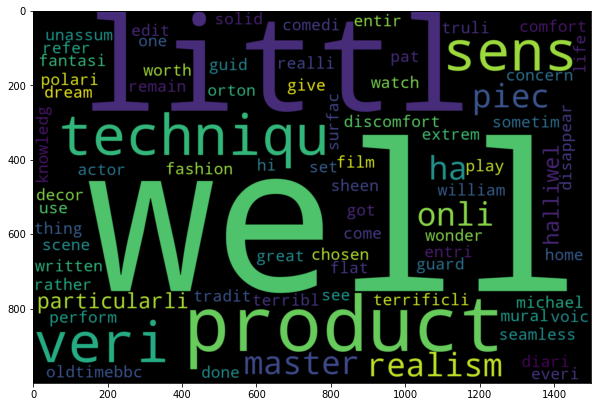

In [116]:
#word cloud for positive review words
plt.figure(figsize=(10,10))
positive_text=norm_train_reviews[1]
WC=WordCloud(width=1500,height=1000,max_words=500,min_font_size=5)
positive_words=WC.generate(positive_text)
plt.imshow(positive_words,interpolation='bilinear')
plt.show

## Word cloud for negative review words

<function matplotlib.pyplot.show(*args, **kw)>

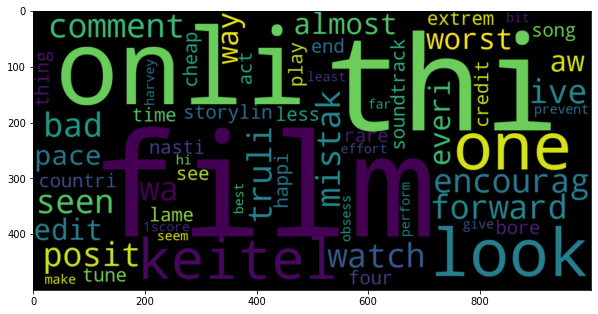

In [117]:
#Word cloud for negative review words
plt.figure(figsize=(10,10))
negative_text=norm_train_reviews[8]
WC=WordCloud(width=1000,height=500,max_words=500,min_font_size=5)
negative_words=WC.generate(negative_text)
plt.imshow(negative_words,interpolation='bilinear')
plt.show

In [128]:
# Creating a random review generator
# Creating a variable for the randomly generated movie review
# printing the random review

index = np.random.randint(X_train.shape[0])

s_instance = X[index]

print(s_instance)

This movie is about a cop Ching Wan Lau trying to catch a super clever thief Ekin Cheng who blackmails an insurance company headed by a Kelly Lin Basically whatever plans the cop tries the thief somehow knows them beforehand This movie covered by handsome lead actors beautiful lead actress and good camera shots of Hong Kong scenes really has no substance at all It s all flash and the flash quickly becomes dull too I lost all interests a third of the way into the movie and there is no redeeming quality after that except for the cinematography which looks good Only consider seeing this movie if you can do so for free Also consider stopping watching the movie minutes into the movie because it s all the same to the end BORING 


In [129]:
# Here we want to predict the random review as either poitive or negative using the created model
# So, the review will be preprocessed similarly to what we did in the dataset before training i.e,
# the words will be converted to integers and the fitted to a maximum length of 100.
# The empty list will store the values.
# Then we create a for loop to iterate through the list 
#

s_instance = tokenizer.texts_to_sequences(s_instance)

flat_list = []

for sublist in s_instance:
  for item in sublist:
    flat_list.append(item)
    
flat_list = [flat_list]

s_instance = pad_sequences(flat_list, padding = 'post', maxlen = maxlength)

model.predict(s_instance)

array([[0.4017534]], dtype=float32)

Positive reviews = close to 1
Negative Reviews = it will predict 0.

Our Random review gives us result 0.40 which is close to 0, means it is NEGATIVE review.

## Conclusion

Accuracy using Logistic Regression(BOW and TFIDF) is 75%.
Accuracy using Linear SVM is 58.29% using TFIDF.
Accuracy using Multinomial Naive Bayes using BOW and TFIDF is 75.09%

Both Logistic regression and naive bayes(multinomial) perform well on dataset for sentiments.


* Accuracy score on CNN is 83.21%
* Accuracy score using Simple deep neural network is 72.35%
* Accuracy using Recurrent neural network(RNN) with LSTM and dropout is 80%
* Accuracy using 2 RNN layer with LSTM is 82%
* CNN model gives best accuracy among all with 83.21% on training and testing dataset.
* Using the RNN(LSTM) with two hidden layer is also best which yield 82% accuracy on both training and testing dataset. 
* Neural Network models effective for sentiment analysis on IMDB reviews.

Optimizing the model furthur may may yield better result using more data.